In [1]:
%load_ext autoreload
%autoreload 2

# Libs

In [4]:
import numpy as np
from matplotlib import pyplot as plt

import cv2
from PIL import Image

import pansharpening

In [5]:
cv2.__version__

'4.5.5'

# Task 1 - [Pansharpening](https://en.wikipedia.org/wiki/Pansharpened_image#:~:text=Pansharpening%20is%20a%20process%20of,technique%20to%20increase%20image%20quality.)

**Task description**

Using 3 images: 
* GRAY.JPG (gray scale image with high resolution), 
* RGB_half.JPG (rotated RGB image with lower resolution), 
* RGB_quater.JPG (rotated RGB image with the lower resolution than other RGB),  

reconstruct RGB image of same resolution which has GRAY_.JPG and compare quality of reconstruction visually

Comment:
You could use any algorithms for pan sharpening and for aligning images coordinate systems.
[Pan-sharping overview](https://desktop.arcgis.com/ru/arcmap/10.3/manage-data/raster-and-images/fundamentals-of-panchromatic-sharpening.htm)

**Note**: plt.imshow expects RBG while OpenCV loads in BGR

## Data loading

It appeared the plt.imshow is not sufficient to see the difference before and after pansharpening. Therefore, I use a [suggestion from stackoverflow](https://gist.github.com/mstfldmr/45d6e47bb661800b982c39d30215bc88permalink_comment_id=3380868#gistcomment-3380868) when I want to highlight the resolution

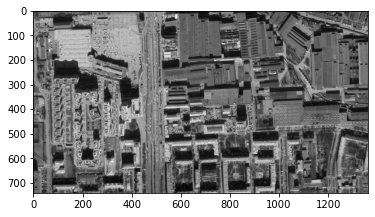

In [6]:
gray_img = cv2.imread('data/GRAY.JPG', cv2.IMREAD_GRAYSCALE)
plt.imshow(gray_img, cmap='gray', vmin=0, vmax=255);

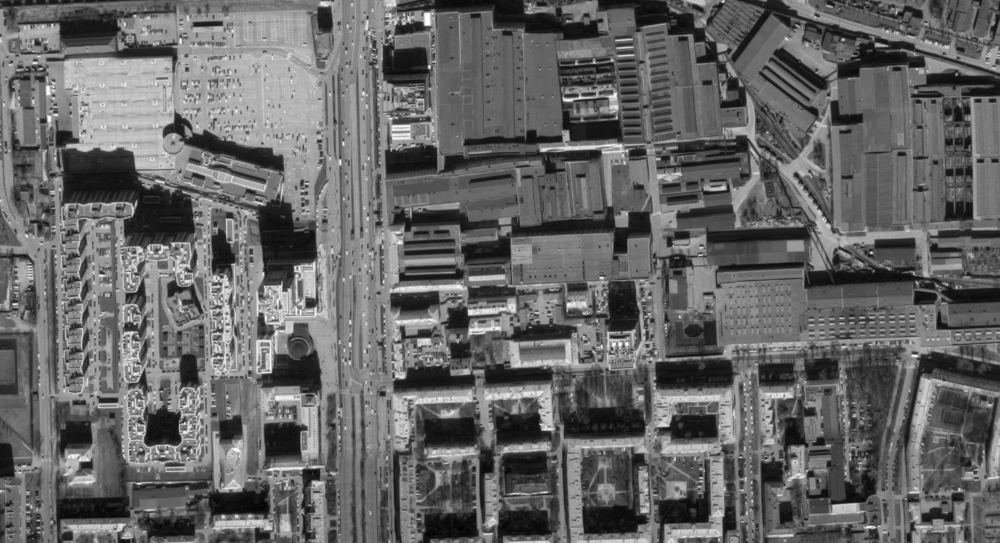

In [7]:
display(Image.fromarray(gray_img))

In [8]:
gray_img.shape

(741, 1363)

In [9]:
len(gray_img.shape)

2

(207, 380, 3)


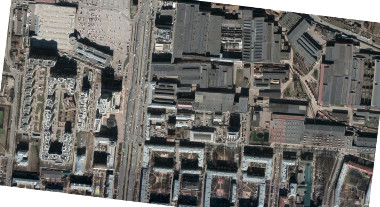

In [24]:
rgb_img_quarter = cv2.imread('data/RGB_quater.JPG')
rgb_img_quarter = cv2.cvtColor(rgb_img_quarter, cv2.COLOR_RGB2BGR)
print(rgb_img_quarter.shape)
display(Image.fromarray(rgb_img_quarter))

(343, 630, 3)


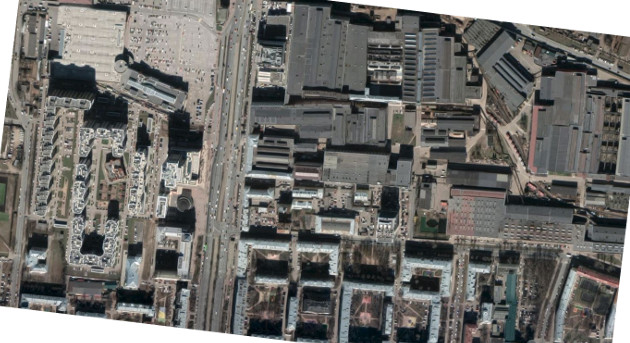

In [25]:
rgb_img_half = cv2.imread('data/RGB_half.JPG')
rgb_img_half = cv2.cvtColor(rgb_img_half, cv2.COLOR_RGB2BGR)
print(rgb_img_half.shape)
display(Image.fromarray(rgb_img_half))

## Step-by-step function usage with comments

### Pansharpening
1. Coloured image is upsampled to the bw image size
2. Find corresponding points with feature detectors
3. Allign RGB image to the BW one (https://docs.opencv.org/3.3.0/da/d6e/tutorial_py_geometric_transformations.html)
4. Transform the coloured one with some interpolation

#### Resizing

In [ ]:
rows, cols = gray_img.shape

rgb_img_res = cv2.resize(src=rgb_img, dst=None, dsize=(cols, rows), 
                         interpolation=cv2.INTER_CUBIC)

display(Image.fromarray(rgb_img_res))

#### Key point extranction and matching

In [10]:
matches, matched_points1, matched_points2, kp1, kp2 = pansharpen.keypoint_matcher(
    rgb_img_res, gray_img, n_points=50, filter_neighbours=True, draw_matches=False)

Before filtering neighbours: 50. After: 15
Some matches contained the same points. After deduplication: 11


In [11]:
for p in zip(matched_points1, matched_points2):
    print(p[0], p[1])

(396.25445556640625, 296.3066711425781) (388.94488525390625, 329.7292785644531)
(392.86962890625, 471.47686767578125) (406.5879211425781, 503.3679504394531)
(720.3995971679688, 586.9624633789062) (746.00439453125, 578.2365112304688)
(761.0770874023438, 212.83773803710938) (741.351806640625, 202.70277404785156)
(199.7982635498047, 527.5634155273438) (221.7577362060547, 582.5540771484375)
(920.9149780273438, 612.9019775390625) (948.5609741210938, 580.2318115234375)
(420.95843505859375, 384.43316650390625) (423.883544921875, 413.63018798828125)
(360.3354187011719, 565.1858520507812) (385.6755676269531, 600.1318969726562)
(1229.469482421875, 126.62049865722656) (1196.08740234375, 61.24506759643555)
(618.4498291015625, 83.59797668457031) (584.9281005859375, 91.34317016601562)
(630.3014526367188, 709.6212158203125) (671.1306762695312, 711.259033203125)


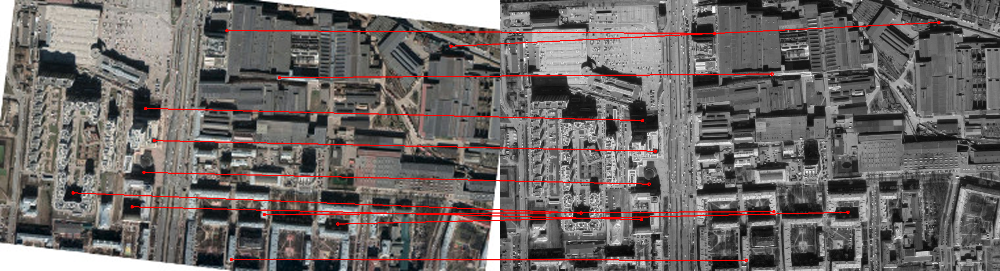

In [12]:
display(Image.fromarray(pansharpen.drawMatches(rgb_img_res, kp1, gray_img, kp2, [m[0] for m in matches])))

#### Allign RGB image to the BW one
Affine or perspective?  
It looks like the photos were made from the same location and therefore affine transformation will be enough

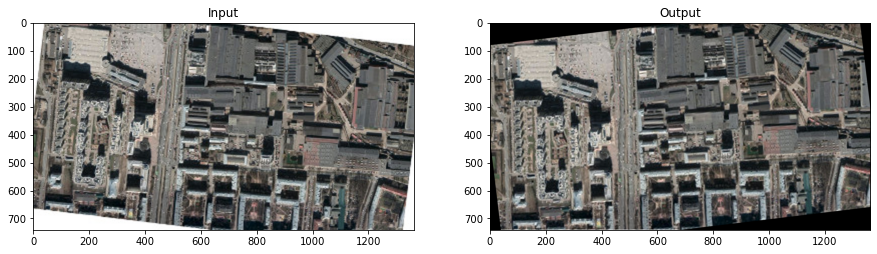

In [95]:
rows, cols, ch = rgb_img_res.shape

M = cv2.getAffineTransform(np.float32(matched_points1[:3]),
                           np.float32(matched_points2[:3]))
dst_aff = cv2.warpAffine(rgb_img_res, M, (cols, rows))
plt.figure(figsize=(15, 15))
plt.subplot(121), plt.imshow(rgb_img_res), plt.title('Input')
plt.subplot(122), plt.imshow(dst_aff), plt.title('Output')
plt.show()

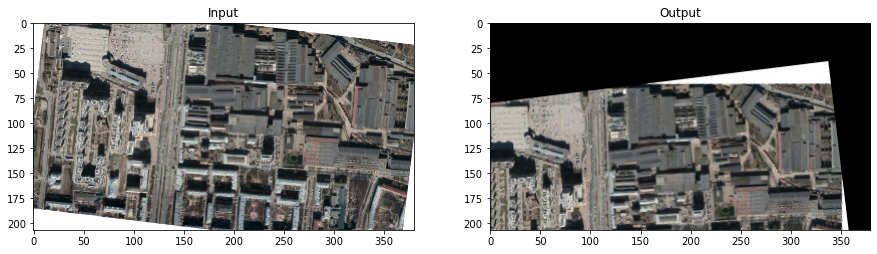

In [96]:
rows, cols, ch = rgb_img.shape

M = cv2.getPerspectiveTransform(np.float32(matched_points1[:4]),
                           np.float32(matched_points2[:4]))
dst_persp = cv2.warpPerspective(rgb_img, M, (cols, rows))
plt.figure(figsize=(15, 15))
plt.subplot(121), plt.imshow(rgb_img), plt.title('Input')
plt.subplot(122), plt.imshow(dst_persp), plt.title('Output')
plt.show()

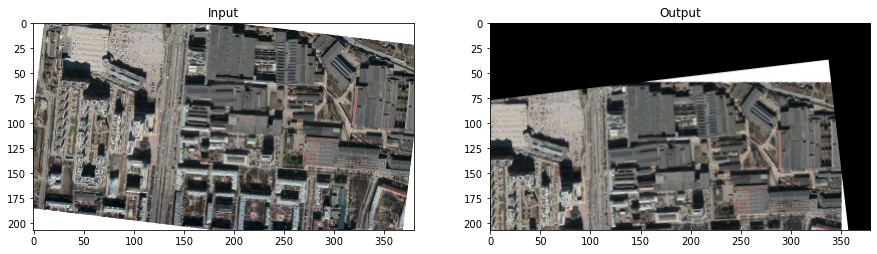

In [99]:
# https://docs.opencv.org/3.4/d1/de0/tutorial_py_feature_homography.html
M, _ = cv2.findHomography(np.float32(matched_points1),
                          np.float32(matched_points2), cv2.RANSAC, 5.0)

dst_persp = cv2.warpPerspective(rgb_img, M, (cols, rows))
plt.figure(figsize=(15, 15))
plt.subplot(121), plt.imshow(rgb_img), plt.title('Input')
plt.subplot(122), plt.imshow(dst_persp), plt.title('Output')
plt.show()

Before filtering neighbours: 25. After: 4
Some matches contained the same points. After deduplication: 4


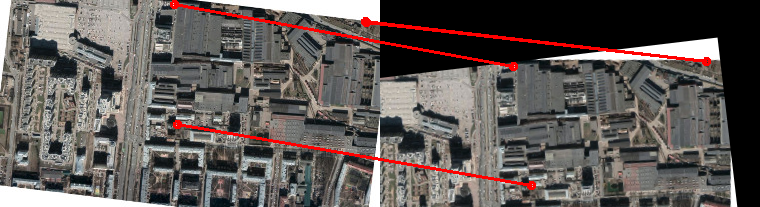

In [101]:
matches, matched_points1, matched_points2, kp1, kp2 = keypoint_matcher(
    rgb_img, dst_persp, n_points=25, filter_neighbours=True, draw_matches=False)

display(Image.fromarray(drawMatches(rgb_img, kp1, dst_persp, kp2, [m[0] for m in matches])))

#### Pansharpen

In [67]:
def pansharpen(rgb_im, bw_im, method='browley', W=0.1):
    
    rgb_new = rgb_im.copy()

    R = rgb_im[:,:,0]
    G = rgb_im[:,:,1]
    B = rgb_im[:,:,2]


    if method == 'simple_mean':
        # overflow encountered in ubyte_scalars
        bw_im_half = 0.5 * bw_im
        rgb_new[:,:,0] = 0.5 * R + bw_im_half
        rgb_new[:,:,1] = 0.5 * G + bw_im_half
        rgb_new[:,:,2] = 0.5 * B + bw_im_half
    elif method == 'hsv':
        hsv_new = cv2.cvtColor(rgb_new, cv2.COLOR_RGB2HSV)
        hsv_new[:,:,2] = bw_im
        rgb_new = cv2.cvtColor(hsv_new, cv2.COLOR_HSV2RGB)
    else:
        raise ValueError('wrong method')
        
    return rgb_new

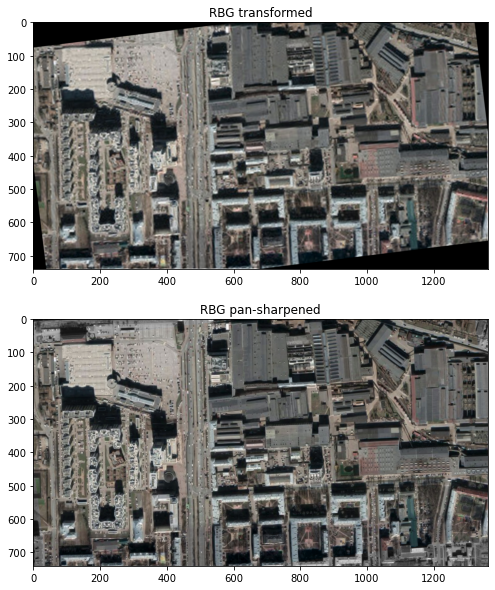

In [68]:
rgb_shapr = pansharpen(dst_aff, gray_img, method='hsv')

plt.figure(figsize=(10, 10))
plt.subplot(211), plt.imshow(dst_aff), plt.title('RBG transformed')
plt.subplot(212), plt.imshow(rgb_shapr), plt.title('RBG pan-sharpened')

plt.show()

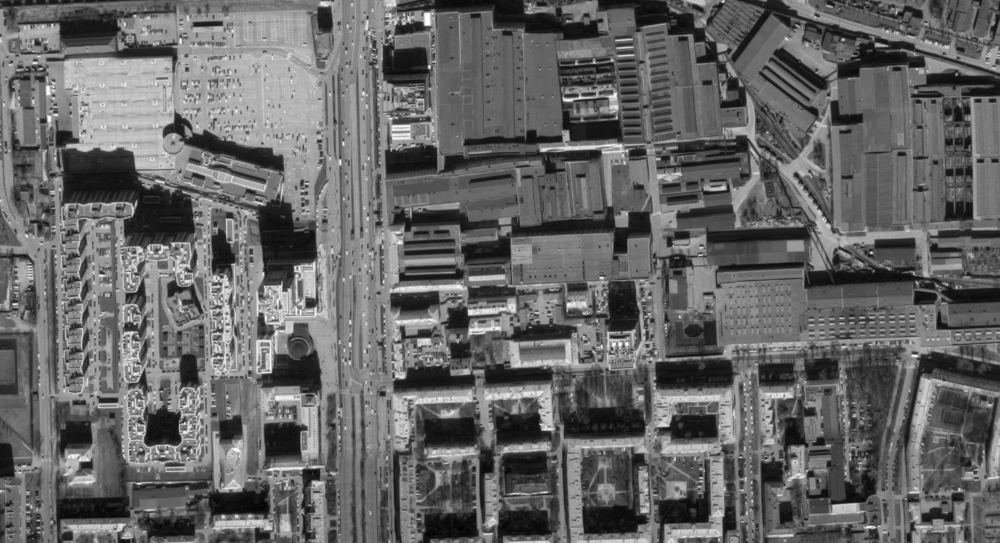

In [69]:
display(Image.fromarray(gray_img))

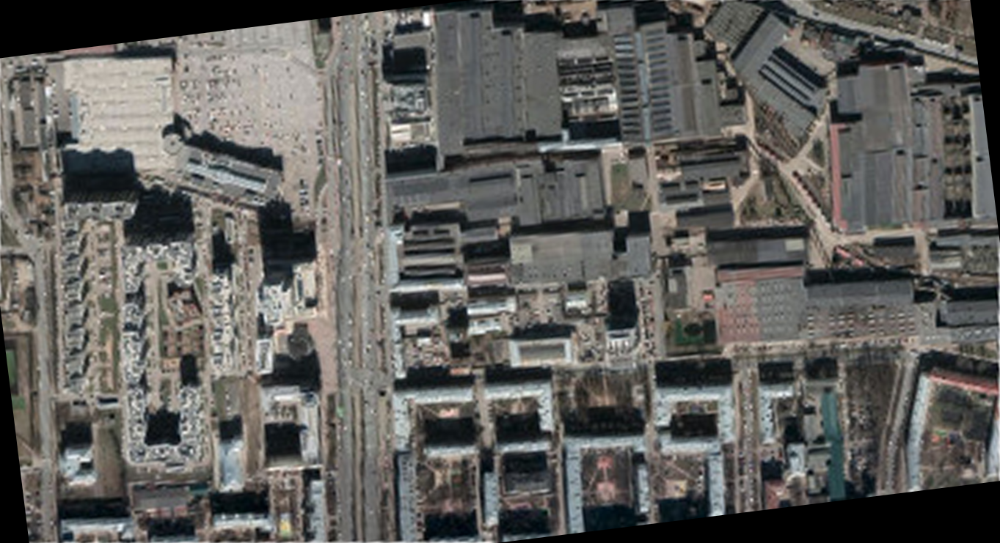

In [70]:
display(Image.fromarray(dst_aff))

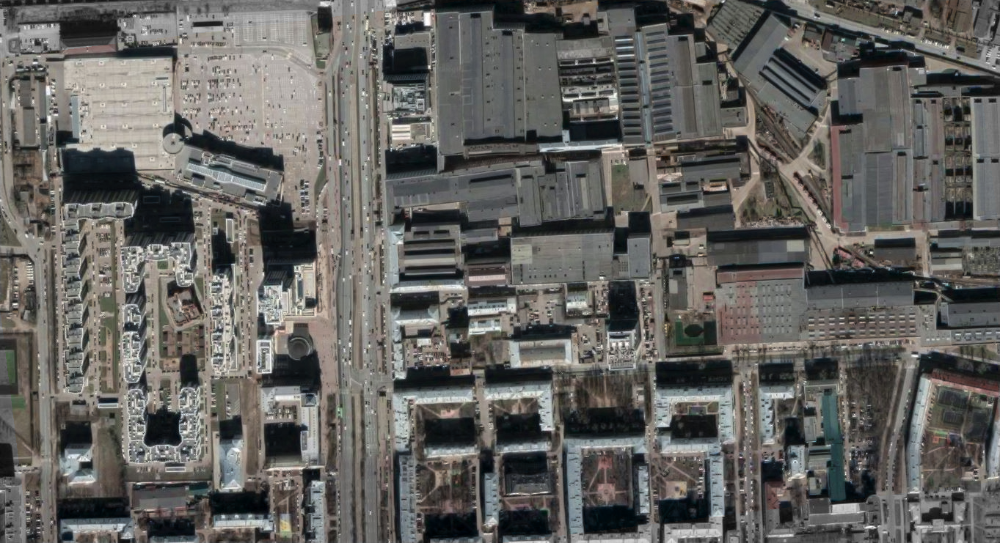

In [71]:
display(Image.fromarray(rgb_shapr))

## Pansharpening function

### HSV

#### Half

kp_matcher_args {'n_points': 30}
Images are of different sizes (343, 630) vs (741, 1363) -> resizing
Before filtering neighbours: 30. After: 10
Some matches contained the same points. After deduplication: 8


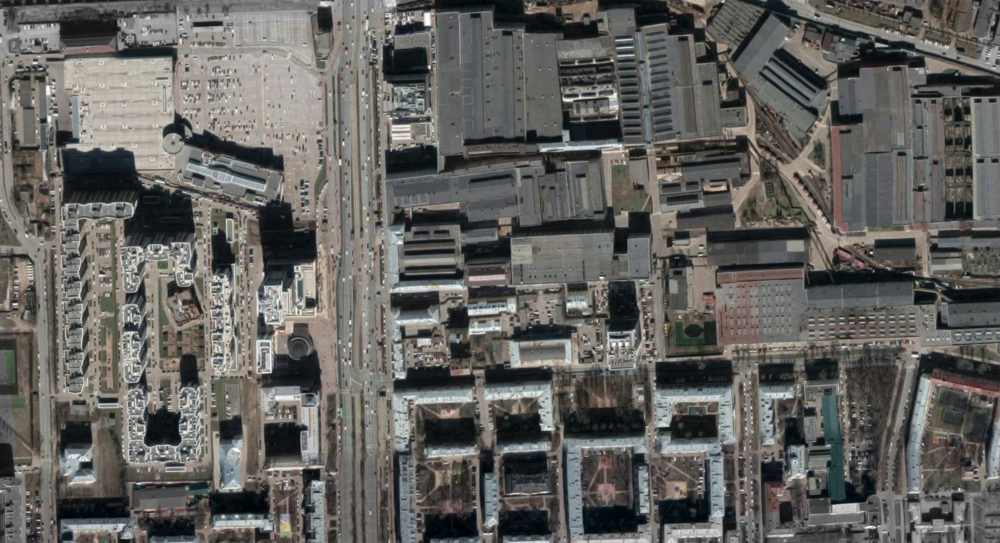

In [28]:
rgb_img_res_sharp, bw_img = pansharpening.pansharpen(rgb_img=rgb_img_half,
                                                     bw_img=gray_img,
                                                     align_method='affine',
                                                     pansharp_method='hsv',
                                                     n_points=30)
display(Image.fromarray(rgb_img_res_sharp))

notes: the image remains black and white in the corners where the transformation left black pixels

#### Quarter

kp_matcher_args {'n_points': 30}
Images are of different sizes (207, 380) vs (741, 1363) -> resizing
Before filtering neighbours: 30. After: 6
Some matches contained the same points. After deduplication: 5


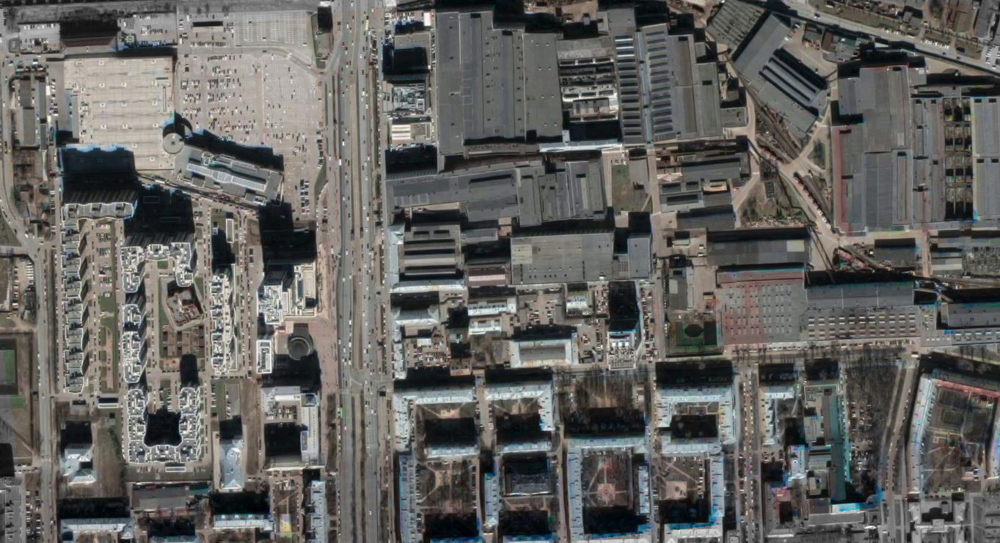

In [30]:
rgb_img_res_sharp, bw_img = pansharpening.pansharpen(rgb_img=rgb_img_quarter,
                                                     bw_img=gray_img,
                                                     align_method='affine',
                                                     pansharp_method='hsv',
                                                     n_points=30)
display(Image.fromarray(rgb_img_res_sharp))

### Mean

#### Half

kp_matcher_args {'n_points': 30}
Images are of different sizes (343, 630) vs (741, 1363) -> resizing
Before filtering neighbours: 30. After: 10
Some matches contained the same points. After deduplication: 8


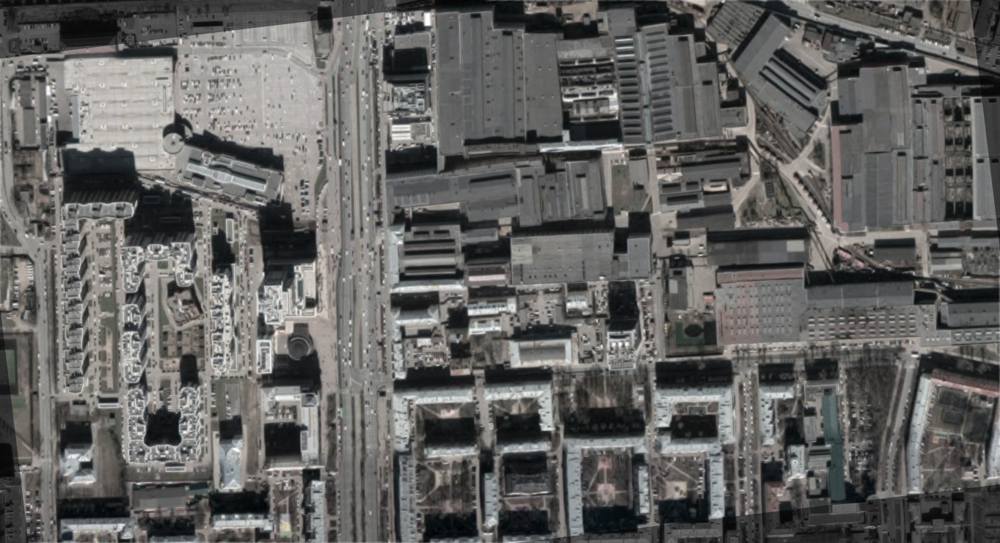

In [31]:
rgb_img_res_sharp, bw_img = pansharpening.pansharpen(rgb_img=rgb_img_half,
                                                     bw_img=gray_img,
                                                     align_method='affine',
                                                     pansharp_method='simple_mean',
                                                     n_points=30)
display(Image.fromarray(rgb_img_res_sharp))

#### Quarter

kp_matcher_args {'n_points': 30}
Images are of different sizes (207, 380) vs (741, 1363) -> resizing
Before filtering neighbours: 30. After: 6
Some matches contained the same points. After deduplication: 5


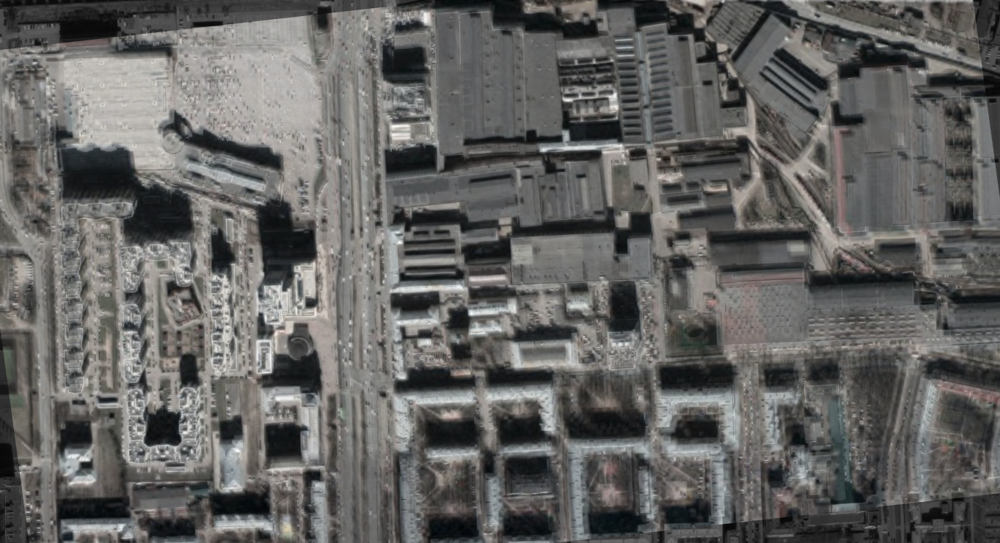

In [32]:
rgb_img_res_sharp, bw_img = pansharpening.pansharpen(rgb_img=rgb_img_quarter,
                                                     bw_img=gray_img,
                                                     align_method='affine',
                                                     pansharp_method='simple_mean',
                                                     n_points=30)
display(Image.fromarray(rgb_img_res_sharp))

# Task 2 - camera calibration

1. Calibrate your web camera
2. Reproduce pose estimation tutorial with calibrated camera https://docs.opencv.org/4.5.0/d7/d53/tutorial_py_pose.html